# Explicando Modelos de Aprendizaje Automático
_(Creado por Daniel Hernández Mota)_


## Temas:
- SHAP 
- LIME 
- Anchors.


Enfoque:
- Modelo de clasificación para datos tabulares



#### Paréntesis: Creacion de ambientes virtuales (virtualenv) 
Para crear un ambiente virtual, primero instalen virtualenv a través de pip
- pip install virtualenv

Posteriormente, creen un ambiente virtual, esto les va a generar una carpeta nueva, generalmente el nombre es: venv. Usen este comando, (dehecho aquí pueden emplear cualquier versión de python, es por esto que sirven mucho, aparte les permite estar organizados):

 - virtualenv venv --python=python3.7
 
Finalmente cuando la hayan creado, tendrán que hacer este comando entrando a la carpeta que crearon, luego al bin para activarlo. De esta manera entrarán al ambiente virtual:
 - source venv/bin/activate
 
Una vez que estén dentro, notarán que no tienen ninguna libería instalada, es porque python está prácticamente nuevo (: entonces instalen las librerías que más desean (se recomienda solo instalar las que les sirvan para el proyecto) si quieren jupyter: pip install jupyer, y las demás por igual.

Para salirse de su ambiente virtual solo escriban en la caja de comandos:
- deactivate

_Si trabajan con anaconda, creo que esto es diferente, no estoy tan seguro... pero me parece que anaconda tiene sus propias  cosas._

Les dejo este link por si algo: https://rukbottoland.com/blog/tutorial-de-python-virtualenv/

### Instalar las librerías necesarias:

In [8]:
!pip install shap
!pip install anchor-exp
!pip install lime
!pip install lightgbm
!pip install seaborn

You should consider upgrading via the '/Users/miguel.d.ferrusca/Documents/ironhack/bin/python3.9 -m pip install --upgrade pip' command.


You should consider upgrading via the '/Users/miguel.d.ferrusca/Documents/ironhack/bin/python3.9 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/miguel.d.ferrusca/Documents/ironhack/bin/python3.9 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/miguel.d.ferrusca/Documents/ironhack/bin/python3.9 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/miguel.d.ferrusca/Documents/ironhack/bin/python3.9 -m pip install --upgrade pip' command.


### Importar las librerías que se ban a usar

In [12]:
# Lo necesario:
import pandas as pd
import numpy as np

# Sklearn
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import roc_auc_score
from sklearn import datasets

# Visualización
import seaborn as sns
import matplotlib.pyplot as plt

# Modelo
from lightgbm import LGBMClassifier

# Explicabilidad:
import shap
import lime
import lime.lime_tabular
from anchor import anchor_tabular


### Descripción del conjunto de datos:

El siguiente conjunto de datos contiene información acerca de un diagnóstico de cancer de mama. La descripción del conjunto de datos se puede obtener del siguiente [link](https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+(Diagnostic)). 

En este caso, las variables fueron determinadas a través de una imagen digitalizada. El objetivo será generar un clasificador para predecir si el cancer de mama será beningno o maligno dado un conjunto de ciertas características. Y, posteriormente realizar la explicación de esta predicción de manera local y global.

In [13]:
# Lectura de datos 
data = datasets.load_breast_cancer()

In [14]:
# Vamos guardando un dataframe para las respuestas
print(data['DESCR'])

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [15]:
data.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [16]:
data['target'][:20]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1])

In [17]:
X = data['data']
y = data['target']

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


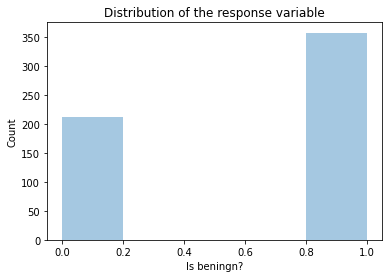

In [18]:
# Response variable
sns.distplot(y, kde=False)
plt.title("Distribution of the response variable")
plt.xlabel("Is beningn?")
plt.ylabel('Count')
plt.show()

### Entrenamiento del modelo:


In [26]:
# Train test-split:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y)
## Esto genera un train de 0.8 y un test de 0.2
X_train, X_eval, y_train, y_eval = train_test_split(X_train, y_train, test_size=0.50, stratify=y_train)
## El eval sería el 50% de 0.8, lo cual equivale a ser el 0.4 del total
## también esto sobre escribe el train, ahora del total en lugar de ser 0.8 se reduce al 40%:

X_train.shape[0]/X.shape[0], X_eval.shape[0]/X.shape[0], X_test.shape[0]/X.shape[0]

(0.3989455184534271, 0.4007029876977153, 0.20035149384885764)

#### Eval: semi importante: hacer optimización de hiperparámetros (generalmente chico, (no tan chico)).
#### --> mejores parámetros
#### Train: más importante, más grande (con este entrenamos el último modelo).
#### Eval2: se revisa para ver que no haya un overfitting. #Early stopping (50 iteraciónes) ** Sólo para algoritmos que hagan iteraciones

#### Test: muy importante, no tan grande (con este evaluamos el desempeño del modelo).
#### OOT: conjunto que no se haya visto involucrado en la temporalidad del entrenamiento.

In [27]:
model = LGBMClassifier()
# Creamos un modelo y generamos la busqueda de hiperparametros simple.

parameters = {
    'learning_rate': [0.01, 0.1, 0.001],
    'max_depth':[3, 4, 5],
    'n_estimators': [10, 50, 100]}

gs = GridSearchCV(model, parameters)
gs.fit(X_eval, y_eval, verbose=False)

GridSearchCV(estimator=LGBMClassifier(),
             param_grid={'learning_rate': [0.01, 0.1, 0.001],
                         'max_depth': [3, 4, 5],
                         'n_estimators': [10, 50, 100]})

In [28]:
# Determinamos el mejor score y parámetros
gs.best_params_, gs.best_score_

({'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100},
 0.9604830917874396)

In [29]:
# Los seleccionamos y entrenamos un modelo con estos valores
model.set_params(**gs.best_params_)
model.fit(X_train, y_train)

LGBMClassifier(max_depth=3)

In [30]:
# Predecimos los valores de entrenamiento
pred = model.predict(X_train)
pred_prob = model.predict_proba(X_train)

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


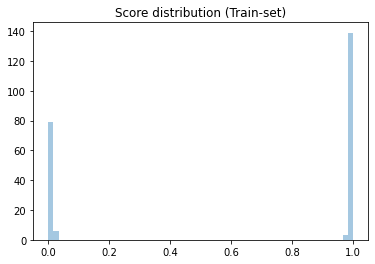

In [31]:
# Agregar color a la grafica con su correspondiente y_train
sns.distplot(pred_prob[:,1], bins=60, kde=False)
plt.title("Score distribution (Train-set)")
plt.show()

In [32]:
# Determinamos el score y vemos el desempeño
roc_auc_score(y_train, pred_prob[:,1])

1.0

In [33]:
# Predecimos los valores de prueba, los guardamos en nuestro dataframe
pred_prob_test = model.predict_proba(X_test)
pred_test = model.predict(X_test)

In [34]:
roc_auc_score(y_test, pred_prob_test[:,1])

0.9976851851851851

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


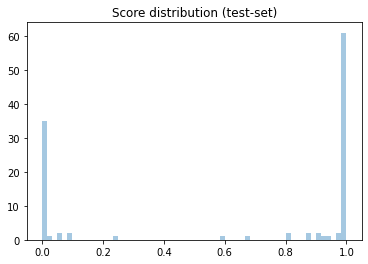

In [35]:
sns.distplot(pred_prob_test[:,1], bins=60, kde=False)
plt.title("Score distribution (test-set)")
plt.show()

In [36]:
malign_index = list(y_test).index(0)

### Explicando el modelo...

#### SHAP:

In [37]:
# Generamos la explicación por SHAP 
explainer_shap = shap.TreeExplainer(model)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


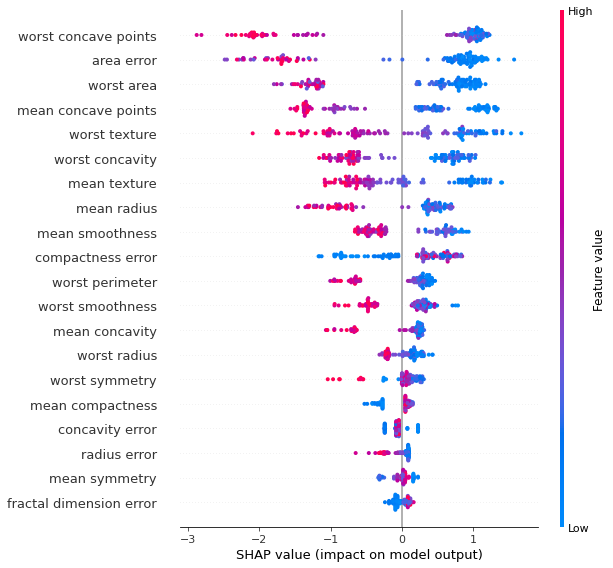

In [38]:
shap_values = explainer_shap.shap_values(X_test)[1]
shap.summary_plot(shap_values, X_test, feature_names=data['feature_names'])

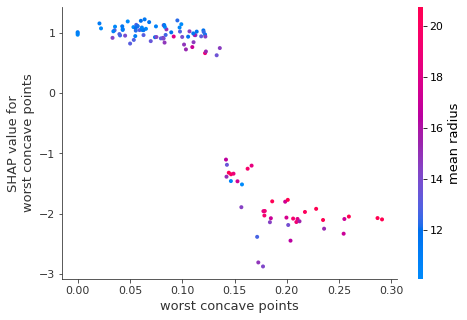

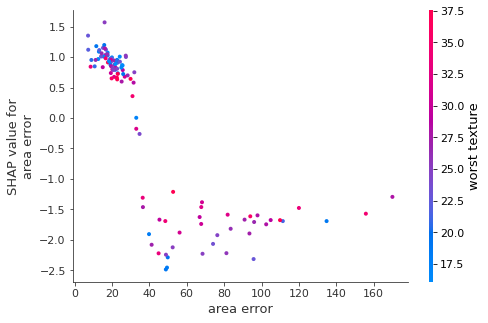

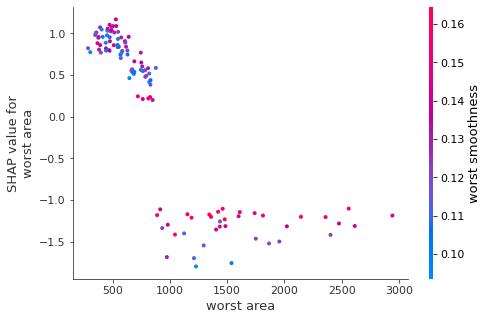

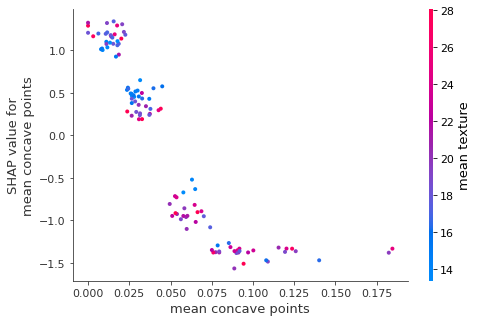

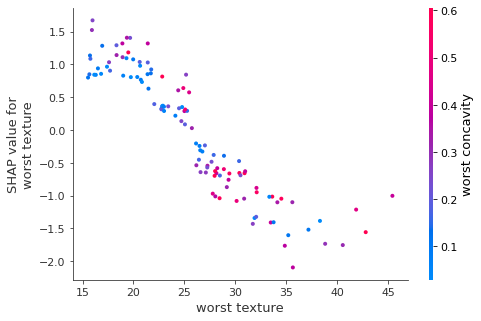

In [39]:
top_inds = np.argsort(-np.sum(np.abs(shap_values), 0))

for i in range(5):
    shap.dependence_plot(top_inds[i], shap_values, X_test, feature_names=data['feature_names'])

In [40]:
shap.initjs()

shap.force_plot(
    base_value=0,
    shap_values=shap_values,
    features=X_test,
    feature_names=data['feature_names'],
    link='logit')

In [41]:
shap.force_plot(
    base_value=0,
    shap_values=shap_values[malign_index,:],
    features=X_test[malign_index,:],
    feature_names=data['feature_names'],
    link='logit')

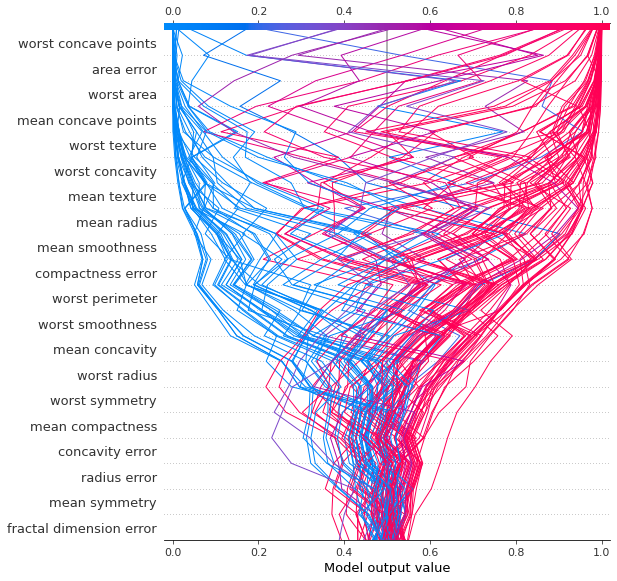

In [42]:
shap.decision_plot(0, shap_values, features=data['feature_names'], link='logit')

#### LIME:

In [43]:
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    X_train,
    feature_names=data['feature_names'],
    class_names=['malign', 'beningn'],
    discretize_continuous=True)

In [44]:
exp_lime = explainer_lime.explain_instance(
    X_test[malign_index,:], model.predict_proba, num_features=2,)

In [45]:
exp_lime.show_in_notebook(show_table=True, show_all=False)

In [46]:
exp_lime = explainer_lime.explain_instance(
    X_test[malign_index,:], model.predict_proba, num_features=10,)
exp_lime.show_in_notebook(show_table=True, show_all=False)

### Anchors

In [47]:
explainer_anchor = anchor_tabular.AnchorTabularExplainer(
    ['malign', 'beningn'],
    data['feature_names'],
    X_train)

In [48]:
exp_anchor = explainer_anchor.explain_instance(
     np.array(X_test[malign_index,:]), model.predict, threshold=0.95)

Al poner el valor de umbral en 0.95, garantizamos con alta probabilidad que  la precisión de nuestra explicación estará arriba de 0.95 (Predicciones en instancias donde se cumple el anchor será similar a la predicción original 95% de las veces')

In [49]:
'Anchor: ' +' AND '.join(exp_anchor.names())

'Anchor: perimeter error > 2.39 AND mean concave points > 0.07'

In [50]:
(('Precision:',exp_anchor.precision()),
('Coverage:', exp_anchor.coverage()))

(('Precision:', 1.0), ('Coverage:', 0.2351))

In [51]:
exp_anchor.show_in_notebook()

In [52]:
exp_anchor = explainer_anchor.explain_instance(
     np.array(X_test[malign_index,:]), model.predict, threshold=0.99)

In [53]:
'Anchor: ' +' AND '.join(exp_anchor.names())

'Anchor: mean symmetry > 0.16 AND mean concave points > 0.07'

In [54]:
(('Precision:',exp_anchor.precision()),
('Coverage:', exp_anchor.coverage()))

(('Precision:', 1.0), ('Coverage:', 0.2331))

In [55]:
exp_anchor.show_in_notebook()